In [ ]:
# ! pip install btester requests yfinance quantstats==0.0.59

In [13]:
import warnings
warnings.filterwarnings("ignore")
import yfinance as yf
import pandas as pd
import requests
from pandas import MultiIndex
from Mybacktest import *
import quantstats as qs

## 讀取股價資料

### 讀取你要的股價資料 (MultiIndex Dataframe, 格式如下: 要有open & close)

In [14]:
data = pd.read_pickle("price.pkl") 
data.columns = MultiIndex.from_tuples(
    [(col[0], 'Close' if col[1] == 'adj_close' else 'Open') for col in data.columns]
)
data.head()

0015             0050              0051          0052         \
           Close  Open      Close       Open  Close   Open  Close   Open   
Date                                                                       
2007-04-23  9.54  9.45  61.210049  60.892624  32.83  32.90  38.40  38.05   
2007-04-24  9.54  9.54  61.474569  61.262953  32.99  32.83  38.65  38.40   
2007-04-25  9.52  9.50  60.945528  61.157145  32.80  32.81  38.59  38.50   
2007-04-26  9.59  9.53  61.051336  61.315857  32.80  32.90  38.60  38.70   
2007-04-27  9.55  9.55  60.839720  61.051336  32.72  32.80  38.40  38.60   

            0053       ...  9951        9955        9958       9960        \
           Close Open  ... Close  Open Close  Open Close Open Close  Open   
Date                   ...                                                  
2007-04-23   NaN  NaN  ...  51.3  50.3  72.4  74.5   NaN  NaN  46.0  46.5   
2007-04-24   NaN  NaN  ...  50.5  51.1  71.6  72.5   NaN  NaN  45.9  45.8   
2007-04-25   NaN  NaN  ...  49.9  50.4  71.6  72.0   NaN  NaN  49.1  46.1   
2007-04-26   NaN  NaN  ...  49.5  49.7  71.0  71.8   NaN  NaN  48.9  49.5   
2007-04-27   NaN  NaN  ...  48.8  49.1  69.5  71.2   NaN  NaN  48.6  48.5   

            9962        
           Close  Open  
Date                    
2007-04-23  49.6  50.6  
2007-04-24  50.4  49.8  
2007-04-25  49.1  50.1  
2007-04-26  48.0  49.0  
2007-04-27  46.5  47.7  

[5 rows x 5064 columns]

In [15]:
filtered_df = data[data.index > '2020-01-01']

# Display the filtered DataFrame
filtered_df

0015             0050                    0051              \
           Close Open       Close        Open       Close        Open   
Date                                                                    
2020-01-02   NaN  NaN  157.261744  156.295466   52.425898   52.041392   
2020-01-03   NaN  NaN  157.261744  158.308545   52.204067   52.529418   
2020-01-06   NaN  NaN  155.248664  156.295466   51.908294   52.204067   
2020-01-07   NaN  NaN  154.765526  155.329188   51.346323   51.745618   
2020-01-08   NaN  NaN  154.040817  153.316109   51.301957   51.287169   
...          ...  ...         ...         ...         ...         ...   
2024-09-19   NaN  NaN  342.390347  338.304089  136.630723  134.003210   
2024-09-20   NaN  NaN  346.761692  347.997072  136.206931  137.224033   
2024-09-23   NaN  NaN  348.282159  346.951750  136.800240  136.461206   
2024-09-24   NaN  NaN  351.608183  348.187130  136.969757  136.800240   
2024-09-25   NaN  NaN  356.834791  356.739762  138.580169  138.664928   

                  0052                    0053              ...        9951  \
                 Close        Open       Close        Open  ...       Close   
Date                                                        ...               
2020-01-02  107.005004  105.545181   60.205532   60.064536  ...  169.870121   
2020-01-03  106.348084  108.026880   60.036336   60.642622  ...  167.440736   
2020-01-06  105.180226  105.107235   59.274955   59.500549  ...  166.132605   
2020-01-07  104.815270  105.253217   58.795567   59.119859  ...  166.693232   
2020-01-08  104.012368  103.647412   58.668670   58.372577  ...  165.198226   
...                ...         ...         ...         ...  ...         ...   
2024-09-19  315.778678  310.215086  151.349644  149.780441  ...  153.327232   
2024-09-20  319.098886  323.047241  153.389608  152.526546  ...  153.801196   
2024-09-23  320.534651  319.457827  153.624989  153.389608  ...  154.512141   
2024-09-24  323.585653  320.534651  155.429572  154.488050  ...  154.749123   
2024-09-25  329.328715  328.431361  157.783377  156.057254  ...  155.460069   

                             9955                   9958              \
                  Open      Close       Open       Close        Open   
Date                                                                   
2020-01-02  170.056997  23.921672  24.112537  104.055100  104.055100   
2020-01-03  170.056997  25.321345  24.176158  102.335181  104.055100   
2020-01-06  167.253860  27.420853  26.721017  101.905201  102.478508   
2020-01-07  166.132605  26.402910  26.975503  100.758589  102.048528   
2020-01-08  165.571977  27.993446  28.629661   97.462077  100.758589   
...                ...        ...        ...         ...         ...   
2024-09-19  151.668360  45.743836  46.570915  368.543729  335.539813   
2024-09-20  154.038178  46.189187  46.507294  379.545035  377.187612   
2024-09-23  154.512141  46.825401  47.588859  383.474072  385.831495   
2024-09-24  154.749123  48.097831  47.270752  388.188917  382.688265   
2024-09-25  155.223087  47.906966  48.543181  374.044382  392.903763   

                 9960                  9962             
                Close       Open      Close       Open  
Date                                                    
2020-01-02  77.389384  78.691040  20.538799  20.538799  
2020-01-03  75.141068  76.561057  20.437122  20.437122  
2020-01-06  72.656088  72.537756  20.111755  20.335444  
2020-01-07  74.431074  74.431074  20.274438  20.091419  
2020-01-08  78.809372  74.786071  20.172761  20.294774  
...               ...        ...        ...        ...  
2024-09-19  79.726748  79.726748  40.061765  40.061765  
2024-09-20  80.036366  80.036366  40.191836  40.451977  
2024-09-23  80.810412  80.036366  40.191836  40.191836  
2024-09-24  81.120031  80.810412  40.582048  40.451977  
2024-09-25  81.429649  81.120031  40.321906  40.451977  

[1151 rows x 5064 columns]

### 讀取大盤benchmark (pd.Series, 時間要對齊result.returns才會跑出正確結果)

In [71]:
from finlab import data
import finlab
finlab.login('ntSS3778pZi2FfkeYxXP0p+S0iI4AggkcphAUxh/lTVrWqT2FreKQsDkTA92CM7d#vip_m')
# Initialize the Data object (log in if required)

# Get TAIEX (台灣加權指數) data
# The symbol for TAIEX is typically '^TWII'
taiex = data.get('world_index:adj_close')['^TWII']

taiex.dropna(inplace=True)
taiex = taiex.loc['2020-01-02':'2024-09-25']
taiex

輸入成功!


date
2020-01-02    12100.480469
2020-01-03    12110.429688
2020-01-06    11953.360352
2020-01-07    11880.320312
2020-01-08    11817.099609
                  ...     
2024-09-19    22042.689453
2024-09-20    22159.419922
2024-09-23    22285.529297
2024-09-24    22431.779297
2024-09-25    22761.599609
Name: ^TWII, Length: 1150, dtype: float64

## 讀取買入訊號

In [26]:
buy_signal = pd.read_csv("sample.csv", dtype={'code': str})
buy_signal['code'] = buy_signal['code'].apply(lambda x: x.zfill(4))
buy_signal = buy_signal.pivot(index='date', columns='code', values='buy')
buy_signal.index = pd.to_datetime(buy_signal.index, format='%Y%m%d')
buy_signal

code,0050,0051,0052,0053,0054,0055,0056,0057,0061,1101,...,9943,9944,9945,9946,9949,9950,9951,9955,9958,9960
date,,,,,,,,,,,,,,,,,,,,,
2020-01-02,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2020-01-03,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2020-01-06,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2020-01-07,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2020-01-08,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2024-05-27,0.0,0.0,0.0,0.0,NaN,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN
2024-05-28,0.0,0.0,0.0,0.0,NaN,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2024-05-29,0.0,0.0,0.0,0.0,NaN,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


## 回測

In [ ]:
class MyStrategy(Strategy):
    def positionSize(self, price: float):
        return round((1e9 / self.max_positions) / price) if price > 0 else 0
    
    ## 如果要複利把 1e9 換成 (self.cash + self.assets_value)

In [20]:
backtest = Backtest(MyStrategy, filtered_df, commission=.001425, cash=1e9)

In [65]:
result = backtest.run(buy_signal, max_positions = 500)

Not Enough Money to buy at 2020-01-09 00:00:00 for stock 6662!
Not Enough Money to buy at 2020-01-09 00:00:00 for stock 8032!
Not Enough Money to buy at 2020-01-09 00:00:00 for stock 8050!
Not Enough Money to buy at 2020-01-09 00:00:00 for stock 8067!
Not Enough Money to buy at 2020-01-09 00:00:00 for stock 8420!
Not Enough Money to buy at 2020-01-09 00:00:00 for stock 8917!
Not Enough Money to buy at 2020-01-09 00:00:00 for stock 8928!
Not Enough Money to buy at 2020-01-09 00:00:00 for stock 8996!
Not Enough Money to buy at 2020-01-09 00:00:00 for stock 9905!
Not Enough Money to buy at 2020-01-09 00:00:00 for stock 9931!
Not Enough Money to buy at 2020-01-09 00:00:00 for stock 9960!
Not Enough Money to buy at 2020-01-10 00:00:00 for stock 1727!
Not Enough Money to buy at 2020-01-10 00:00:00 for stock 1735!
Not Enough Money to buy at 2020-01-10 00:00:00 for stock 1796!
Not Enough Money to buy at 2020-01-10 00:00:00 for stock 2029!
Not Enough Money to buy at 2020-01-10 00:00:00 for stoc

In [54]:
result.returns

2020-01-02    1.000000e+09
2020-01-03    9.989269e+08
2020-01-06    9.986064e+08
2020-01-07    9.968780e+08
2020-01-08    9.969351e+08
                  ...     
2024-09-19    1.484107e+09
2024-09-20    1.484107e+09
2024-09-23    1.484107e+09
2024-09-24    1.484107e+09
2024-09-25    1.484107e+09
Length: 1150, dtype: float64

In [ ]:
# Make sure the shape is aligned to prevent potential errors
taiex

date
2020-01-02    12100.480469
2020-01-03    12110.429688
2020-01-06    11953.360352
2020-01-07    11880.320312
2020-01-08    11817.099609
                  ...     
2024-09-19    22042.689453
2024-09-20    22159.419922
2024-09-23    22285.529297
2024-09-24    22431.779297
2024-09-25    22761.599609
Name: ^TWII, Length: 1150, dtype: float64

In [ ]:
qs.reports.metrics(result.returns, taiex, compounded=True)

                    Strategy    Benchmark
------------------  ----------  -----------
Start Period        2020-01-02  2020-01-02
End Period          2024-09-25  2024-09-25
Risk-Free Rate      0.0%        0.0%
Time in Market      96.0%       100.0%

Cumulative Return   48.41%      88.1%
CAGR﹪              8.7%        14.28%

Sharpe              1.1         0.83
Prob. Sharpe Ratio  98.6%       95.94%
Sortino             1.42        1.15
Sortino/√2          1.0         0.81
Omega               1.23        1.23

Max Drawdown        -19.63%     -31.63%
Longest DD Days     308         771

Gain/Pain Ratio     0.23        0.16
Gain/Pain (1M)      0.89        0.85

Payoff Ratio        0.8         0.84
Profit Factor       1.23        1.16
Common Sense Ratio  1.19        1.11
CPC Index           0.58        0.54
Tail Ratio          0.96        0.95
Outlier Win Ratio   6.52        2.47
Outlier Loss Ratio  6.61        2.91

MTD                 0.0%        2.22%
3M                  0.35%       -0.2

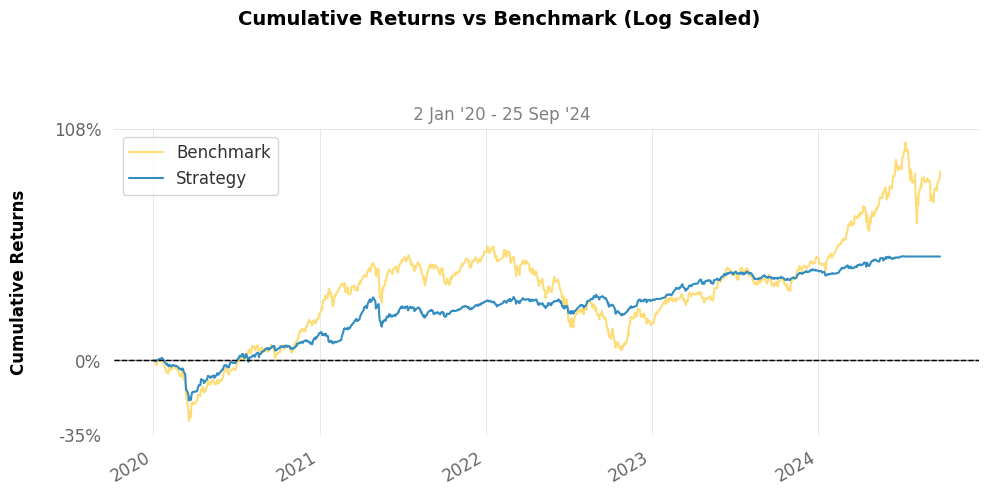

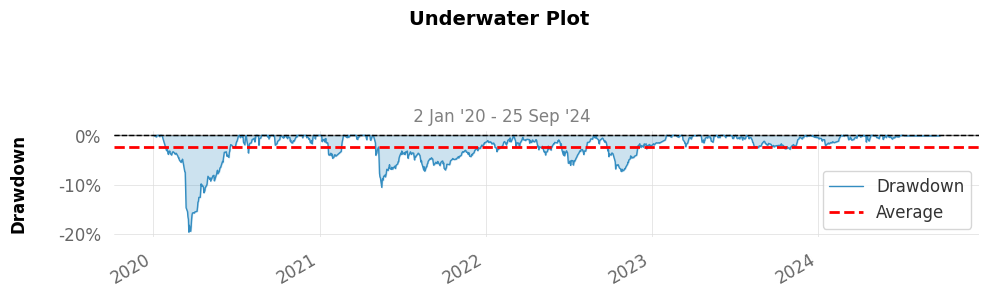

In [70]:
qs.plots.log_returns(result.returns, taiex, fontname='sans-serif', compound=True)
qs.plots.drawdown(result.returns, figsize=(10,3), fontname='sans-serif')

In [10]:
trades = pd.DataFrame(result.trades)
trades

,symbol,open_date,close_date,open_price,close_price,position_size,exit_reason,profit_loss,change_pct,trade_commission,cumulative_return
0,2338,2020-01-03,2020-01-08,66.413341,59.161309,30114,Stop Loss,-218387.675153,-10.919540,10733.466882,9.997709e+08
1,2329,2020-01-03,2020-01-30,6.011567,5.321715,332692,Stop Loss,-229508.220985,-11.475410,10684.427359,9.995307e+08
2,2331,2020-01-03,2020-01-31,30.080871,26.320762,66487,Stop Loss,-249998.354703,-12.500000,10593.680281,9.992701e+08
3,2330,2020-01-03,2020-02-21,669.628401,632.643112,2987,Exceed Maximum Holding Period,-110475.060055,-5.523256,11212.201062,9.991484e+08
4,2337,2020-01-03,2020-02-21,33.105513,30.506496,60413,Exceed Maximum Holding Period,-157014.418730,-7.850708,11005.230699,9.989804e+08
5,2330,2020-01-07,2020-02-25,647.242568,626.803329,3090,Exceed Maximum Holding Period,-63157.248489,-3.157895,11420.409458,9.989058e+08


In [30]:
open_positions = pd.DataFrame(result.open_positions)
open_positions

""
